# Exploring Geospatial Data with Folium in Python


In [163]:
# !pip install folium
import folium

## Creating a basic map

In [164]:
# create map
m = folium.Map()

# view map
display(m)

# save interactive map as html file
m.save("map.html")


In [165]:
# Add a Geolocation and Adjust the Zoom Level

m = folium.Map(location = [51.529163, -0.109970], 
             zoom_start = 10
         )
m

In [166]:
# Customise appearance through tiles
m = folium.Map(location = [51.529163, -0.109970], 
             zoom_start = 14,
             # tiles='OpenStreetMap',
              tiles='cartodbpositron'    
         )
m

m

## Adding Markers to the Map

In [167]:
# reading in csv data
import pandas as pd

# file paths to data
fpath = 'data/bike_stations.csv'

bike_df = pd.read_csv(fpath)
display(bike_df.head())
bike_df.shape


,Station ID,Capacity,Latitude,Longitude,Station Name
0,1,19,51.529163,-0.109970,"River Street , Clerkenwell"
1,2,37,51.499606,-0.197574,"Phillimore Gardens, Kensington"
2,3,32,51.521283,-0.084605,"Christopher Street, Liverpool Street"
3,4,23,51.530059,-0.120973,"St. Chad's Street, King's Cross"
4,5,27,51.493130,-0.156876,"Sedding Street, Sloane Square"


(773, 5)

In [168]:
# plot base map
m = folium.Map(location=[bike_df.Latitude.mean(), bike_df.Longitude.mean()], 
               zoom_start=15, 
               control_scale=True,
               tiles='cartodbpositron',
              tooltip = 'This tooltip will appear on hover')

#Loop through each row in the bike stations dataframe
for i,row in bike_df.iterrows():
    
    #Setup the content of the popup
    html=f"""
        <p>{row["Station Name"]}</p>
        <p>Capacity: {row["Capacity"]}</p>
        """
    iframe = folium.IFrame(html=html)
    
    #Initialise the popup using the iframe
    popup = folium.Popup(iframe, min_width=200, max_width=300)
    
    #Add each row to the map
    folium.Marker(location=[row['Latitude'],row['Longitude']],
                  popup = popup, c='blue').add_to(m)    
m   

Dowload geometry data from gov.uk

[Statistical GIS Boundary Files for London](https://www.data.gov.uk/dataset/6cdebf5d-c69b-4480-8c9c-53ab8a816b9d/statistical-gis-boundary-files-for-london)

,NAME,GSS_CODE,DISTRICT,LAGSSCODE,HECTARES,NONLD_AREA,geometry
0,Chessington South,E05000405,Kingston upon Thames,E09000021,755.173,0.0,"POLYGON ((516401.596 160201.802, 516407.302 16..."
1,Tolworth and Hook Rise,E05000414,Kingston upon Thames,E09000021,259.464,0.0,"POLYGON ((519552.998 164295.600, 519508.096 16..."
2,Berrylands,E05000401,Kingston upon Thames,E09000021,145.390,0.0,"POLYGON ((518107.499 167303.399, 518114.301 16..."
3,Alexandra,E05000400,Kingston upon Thames,E09000021,268.506,0.0,"POLYGON ((520336.700 165105.498, 520332.198 16..."
4,Beverley,E05000402,Kingston upon Thames,E09000021,187.821,0.0,"POLYGON ((521201.203 169275.505, 521204.303 16..."


<AxesSubplot:>

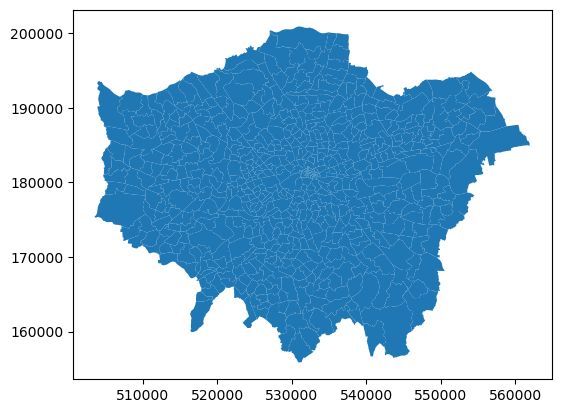

In [160]:
# !pip install geopandas
# !conda install geopandas
import geopandas as gpd

ward_gdf = gpd.read_file('data/London_Ward.geojson')
display(ward_df.head())

ward_gdf.plot()

In [169]:
# create base map
m=folium.Map(location= [bike_df.Latitude.mean(), bike_df.Longitude.mean()], 
             zoom_start=15,             
              tiles='cartodbpositron'
         )

# display ward data
folium.GeoJson(ward_gdf, 
               style_function = lambda x: {
                  'color' :  'blue',
                  'opacity' : 0.50,
                  'weight' : 1,
                }
              ).add_to(m)


folium.LayerControl().add_to(m)

m.save('map.html')
m

In [170]:
# Create base map
m=folium.Map(location= [bike_df.Latitude.mean(), bike_df.Longitude.mean()], 
             zoom_start=14,             
             tiles='cartodbpositron'    
         )

#Loop through each row in the dataframe
for i,row in bike_df.iterrows():
    
    #Setup the content of the popup
    html=f"""
        <p>{row["Station Name"]}</p>
        <p>Capacity: {row["Capacity"]}</p>
        """
    iframe = folium.IFrame(html=html)
    
    #Initialise the popup using the iframe
    popup = folium.Popup(iframe, min_width=200, max_width=400)
    
    #Add each row to the map
    folium.Marker(location=[row['Latitude'],row['Longitude']],
                  popup = popup, c='blue').add_to(m)  
    
folium.GeoJson(df, 
               style_function = lambda x: {
                  'color' :  'blue',
                  'opacity' : 0.50,
                  'weight' : 1,
                }
              ).add_to(m)
folium.LayerControl().add_to(m)

m.save('map.html')
m

## Bibliography

### Folium
- [Your Guide to Getting Started with Geospatial Analysis using Folium (with multiple case studies)](https://www.analyticsvidhya.com/blog/2020/06/guide-geospatial-analysis-folium-python/)
- [Python Folium: Create Web Maps From Your Data](https://realpython.com/python-folium-web-maps-from-data/)
- [Creating a Simple Map with Folium and Python](https://towardsdatascience.com/creating-a-simple-map-with-folium-and-python-4c083abfff94)
- [Add Markers on Folium Map](https://python-graph-gallery.com/312-add-markers-on-folium-map/)
<br>


### Geographical Information Systems (GIS)

- [Introduction_to_GIS_Fundamentals](https://training.datapolitan.com/qgis-training/Introduction_to_GIS_Fundamentals/#1)